In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from pytorchvideo.data import Kinetics, RandomClipSampler
from pytorchvideo.transforms import (
    ApplyTransformToKey,
    Normalize,
    RandomResizedCrop,
    Div255,
    Permute
)

from torchvision.transforms import (
    Compose,
    RandomHorizontalFlip
)
from tqdm import tqdm

import sys
sys.path.insert(1, '../utils')
sys.path.insert(1, '../src')
from random_temporal_subsample import RandomTemporalSubsample
from vit import Embedding, CrossSelfDecoder, ViT_Encoder, Masking

/Users/aweers/git/dd2412_project/env/lib/python3.10/site-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(


# Overfit to one sample

In [2]:
BATCH_SIZE = 1
NUM_WORKERS = 0 # Has to be 0 for jupyter notebooks
CHANNELS = 3
IMAGE_SIZE = 224
REPEATED_SAMPLING_FACTOR = 2

# ViT hyperparameters
patch_size = 32
D = 128
encoder_heads = 8
encoder_layers = 2
encoder_mlp_dim = 128
decoder_heads = 8
decoder_layers = 2
decoder_mlp_dim = 128
mlp_activation = nn.ReLU()

# masking
mask_ratio = 0.6
mask_type = 'random'

# other hyperparameters
frame_gap_range = (4, 5)
fps = 29


# Calculated parameters
clip_duration = frame_gap_range[1] / fps + 0.0001

device = torch.device("cpu")
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    
print("Using device =", device)

Using device = mps


In [3]:
transform = Compose(
    [
    ApplyTransformToKey(
        key="video",
        transform=Compose(
            [
            RandomTemporalSubsample(frame_gap_range[0], frame_gap_range[1], repeated_sampling=REPEATED_SAMPLING_FACTOR),
            RandomResizedCrop(IMAGE_SIZE, IMAGE_SIZE, scale=(0.2, 1.0), aspect_ratio=(1.0, 1.0), interpolation='bilinear'),
            Div255(),
            # mean and std from ImageNet
            Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            # Permute to get Frames, Channel, Height, Width
            Permute((1, 0, 2, 3)),
            RandomHorizontalFlip(p=0.5)
            ]
        ),
        ),
    ]
)

def unnormalize(tensor):
    return tensor * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)

In [4]:
data = Kinetics("../data/", clip_sampler=RandomClipSampler(clip_duration=clip_duration), decode_audio=False, transform=transform)

In [39]:
print(data.num_videos)

dloader = torch.utils.data.DataLoader(
        data,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS
    )

1365


In [40]:
# Create ViT
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

embedding = Embedding(D, patch_size, CHANNELS, IMAGE_SIZE//patch_size * IMAGE_SIZE//patch_size)
encoder = ViT_Encoder(D, encoder_heads, (encoder_mlp_dim, mlp_activation), encoder_layers)
decoder = CrossSelfDecoder(D, decoder_heads, (decoder_mlp_dim, mlp_activation), decoder_layers)
masking = Masking(D)

embedding.train(), encoder.train(), decoder.train(), masking.train()

embedding.to(device)
encoder.to(device)
decoder.to(device)
masking.to(device)

embedding_params = count_parameters(embedding)
encoder_params = count_parameters(encoder)
decoder_params = count_parameters(decoder)
masking_params = count_parameters(masking)

model = (embedding, encoder, decoder, masking)

print("Embedding parameters:", embedding_params)
print("Encoder parameters:", encoder_params)
print("Decoder parameters:", decoder_params)
print("Masking parameters:", masking_params)
print("Total parameters:", embedding_params + encoder_params + decoder_params + masking_params)

Embedding parameters: 789632
Encoder parameters: 199168
Decoder parameters: 331776
Masking parameters: 128
Total parameters: 1320704


In [41]:
def validate(model, dataloader, loss_fn):
    return 0.0

DEBUG = False
def train(model, dataloader, vdataloader, loss_fn, optimizer, epochs):
    batch_orig = None
    for b in dataloader:
        batch_orig = b
        break
    train_loss = []
    val_loss = []
    embedding, encoder, decoder, masking = model
    for epoch in range(epochs):
        epoch_loss = 0
        #for batch_nr, batch in enumerate(dataloader):
        #for batch_nr, batch in enumerate(tqdm(dataloader, total=data.num_videos//BATCH_SIZE)):
        batch = batch_orig

        # batch.shape = (batch_size, repeated_sampled_frames, channels, height, width)
        # change to (batch_size * repeated_sampled_frames, channels, height, width)
        batch_size = batch['video'].shape[0] # actual batch size (important for last batch)
        batch = batch['video'].to(device)
        images = batch.view(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)
        if DEBUG: print("images.shape: ", images.shape)
        optimizer.zero_grad()
        # embedding
        embeddings = embedding.embedding(images).view(batch_size, REPEATED_SAMPLING_FACTOR+1, -1, D)
        #print(embeddings[0, 0, 0, :5])
        if DEBUG: print("Embeddings.shape: ", embeddings.shape)

        # masking
        first_frame = embeddings[:, 0, :, :]
        if DEBUG: print("First_frame.shape: ", first_frame.shape)
        future_frames, shuff_idx, skipped_token = masking.mask(embeddings[:, 1:, :, :].reshape(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), mask_ratio, mask_type)
        n_embeddings = future_frames.shape[-2]
        if DEBUG: print("Future_frames.shape: ", future_frames.shape)

        # encoder
        first_frame = encoder(first_frame)
        if DEBUG: print("First_frame.shape (after encoding): ", first_frame.shape)
        future_frames = encoder(future_frames)
        #print(future_frames[0, 0, :5])
        if DEBUG: print("Future_frames.shape (after encoding): ", future_frames.shape)

        # unmasking
        future_frames = masking.unmask(future_frames, mask_type, shuff_idx, skipped_token)
        if DEBUG: print("Future_frames.shape (after unmasking): ", future_frames.shape)

        # decoder (future_frames is the query, first_frame provide key and value)
        # future_frames.shape = (batch_size * repeated_sampled_frames, N, D)
        # first_frame.shape = (batch_size, N, D)
        
        # TODO: check if this is correct
        output = decoder(future_frames, first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D))
        #output = decoder(first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), future_frames)
        if DEBUG: print("Output.shape: ", output.shape)
        #print(output[0, 0, :5])

        # unembedding
        output = embedding.unembedding(output)
        if DEBUG: print("Output.shape (after unembedding): ", output.shape)

        # calculate loss
        #loss = loss_fn(output.reshape(-1, 1), batch[:, 1:, :, :, :].reshape(-1, 1))
        mask = masking.create_mask(IMAGE_SIZE//patch_size, mask_type, shuff_idx, skipped_token, H=IMAGE_SIZE, W=IMAGE_SIZE, device=device)
        
        # Loss is calculated only on the masked tokens (MAE)
        loss = (loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)) * mask).sum() / mask.sum()

        # Loss is calculated on all tokens (SiamMAE)
        #loss = loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)).mean()

        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()

        train_loss.append(epoch_loss/(data.num_videos//BATCH_SIZE))
        val_loss.append(validate(model, vdataloader, loss_fn))
        if epoch % 100 == 0:
            print("Epoch", epoch, "Training loss:", train_loss[-1], "Validation loss:", val_loss[-1])
            # plot image
            fig, ax = plt.subplots(1, 4)
            
            ax[0].imshow(unnormalize(batch[0, 0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[1].imshow(unnormalize(batch[0, 1, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[2].imshow(unnormalize(output[0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[3].imshow(mask[0, :, :].permute(1, 2, 0).detach().cpu().numpy())
            plt.show()
    return train_loss, val_loss


In [42]:
optimizer = torch.optim.AdamW(list(embedding.parameters()) + list(encoder.parameters()) + list(decoder.parameters()) + list(masking.parameters()), lr=3e-4, betas=(0.9, 0.95), weight_decay=0.05)

Epoch 0 Training loss: 0.002978843996376345 Validation loss: 0.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


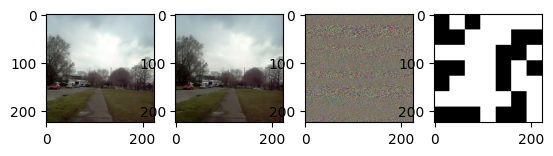

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 100 Training loss: 0.0016593793372968178 Validation loss: 0.0


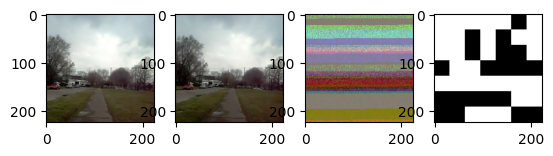

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 200 Training loss: 0.0021309471829033598 Validation loss: 0.0


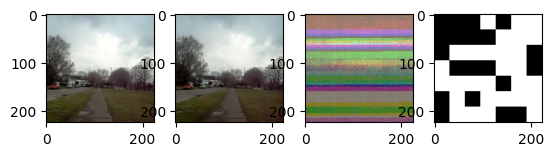

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 300 Training loss: 0.0018106633490258522 Validation loss: 0.0


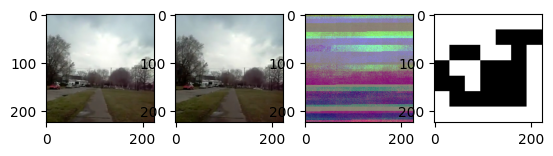

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 400 Training loss: 0.0018239414298927392 Validation loss: 0.0


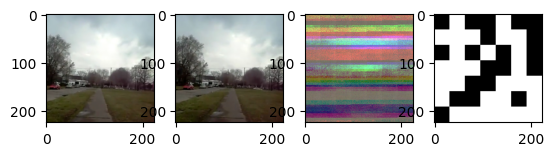

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 500 Training loss: 0.0016136515271532666 Validation loss: 0.0


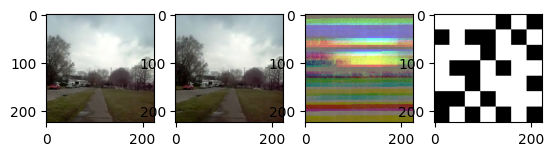

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 600 Training loss: 0.0016879976014077883 Validation loss: 0.0


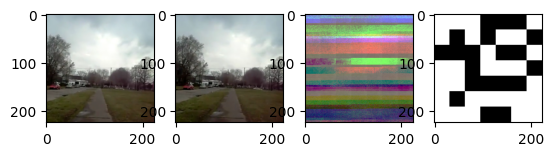

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 700 Training loss: 0.0017587777022477036 Validation loss: 0.0


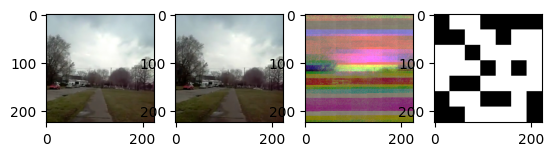

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 800 Training loss: 0.0015498528113731971 Validation loss: 0.0


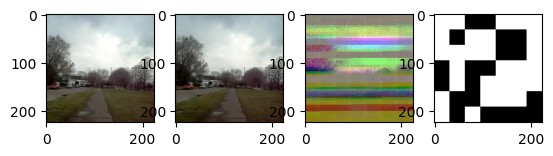

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 900 Training loss: 0.001671605931096898 Validation loss: 0.0


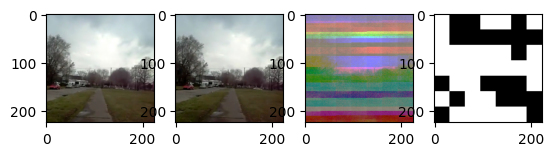

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1000 Training loss: 0.0015692850608965416 Validation loss: 0.0


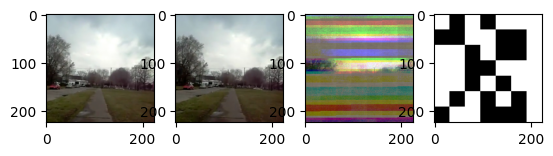

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1100 Training loss: 0.001303468169746818 Validation loss: 0.0


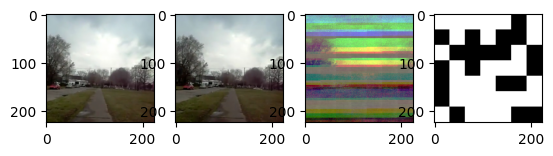

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1200 Training loss: 0.001369589327019213 Validation loss: 0.0


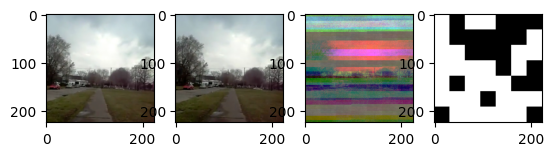

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1300 Training loss: 0.0017557580829103351 Validation loss: 0.0


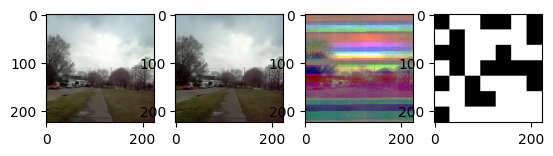

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1400 Training loss: 0.0015319459167592254 Validation loss: 0.0


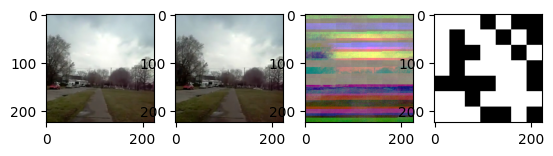

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1500 Training loss: 0.0017096915961185217 Validation loss: 0.0


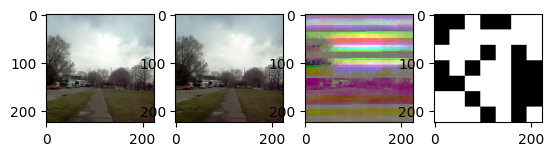

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1600 Training loss: 0.0016884548760159111 Validation loss: 0.0


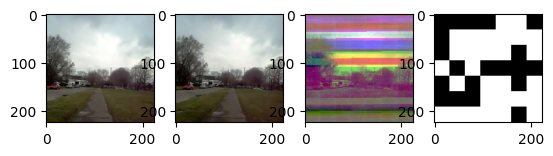

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1700 Training loss: 0.0014949835263765776 Validation loss: 0.0


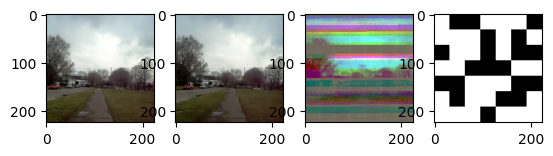

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1800 Training loss: 0.0014479979490622495 Validation loss: 0.0


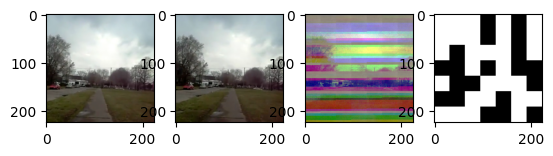

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 1900 Training loss: 0.0015536233182355161 Validation loss: 0.0


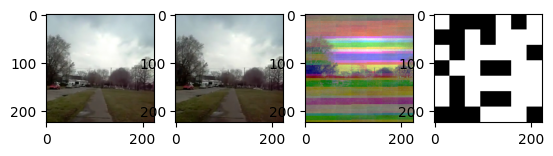

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2000 Training loss: 0.0013906995892088055 Validation loss: 0.0


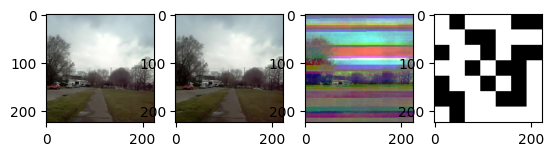

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2100 Training loss: 0.001547141826196468 Validation loss: 0.0


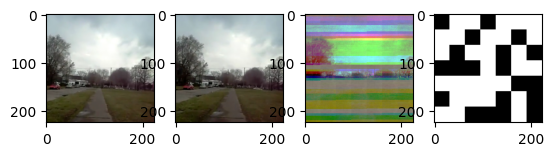

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2200 Training loss: 0.0016298756931290958 Validation loss: 0.0


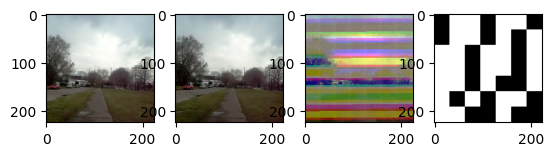

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2300 Training loss: 0.0013320152576153095 Validation loss: 0.0


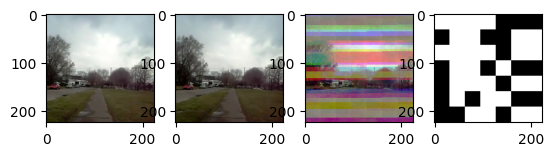

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2400 Training loss: 0.0014000646360627898 Validation loss: 0.0


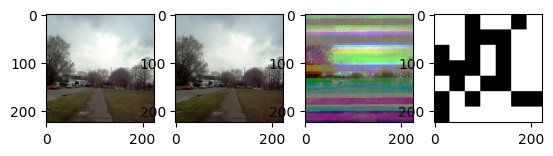

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2500 Training loss: 0.0017710327665447752 Validation loss: 0.0


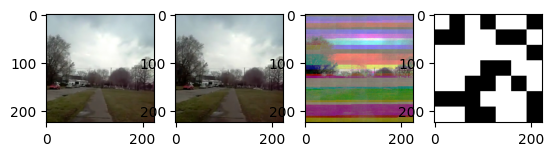

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2600 Training loss: 0.0014105176750993553 Validation loss: 0.0


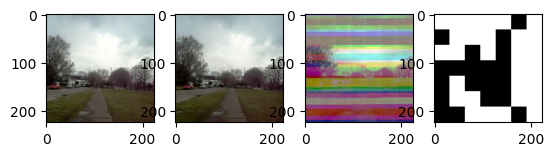

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2700 Training loss: 0.00137610531551934 Validation loss: 0.0


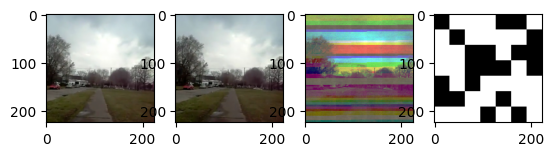

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2800 Training loss: 0.0016169551527980483 Validation loss: 0.0


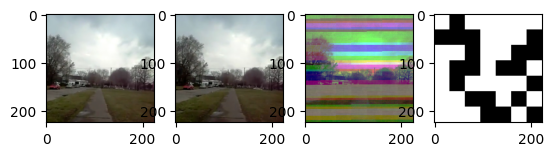

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 2900 Training loss: 0.0015256307063958583 Validation loss: 0.0


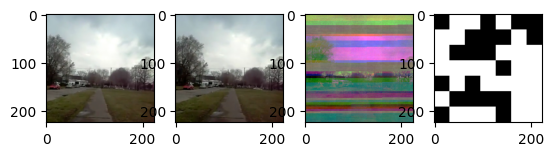

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3000 Training loss: 0.001413663490351303 Validation loss: 0.0


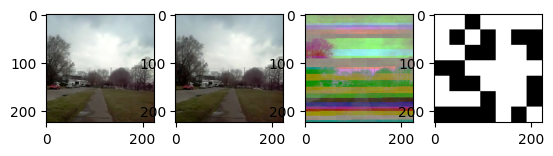

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3100 Training loss: 0.0015218243930802677 Validation loss: 0.0


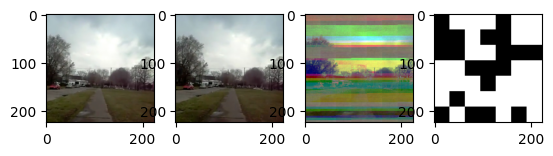

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3200 Training loss: 0.0015140308128608452 Validation loss: 0.0


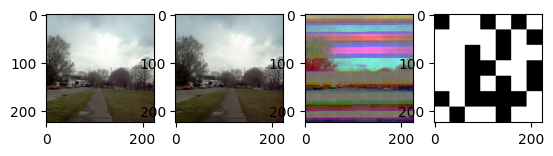

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3300 Training loss: 0.001533091548598293 Validation loss: 0.0


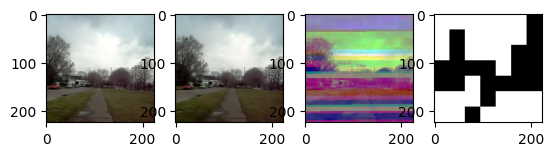

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3400 Training loss: 0.001573976055606381 Validation loss: 0.0


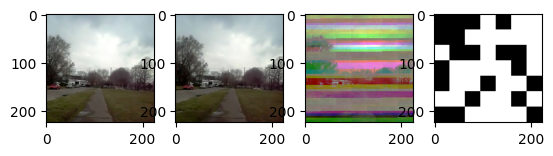

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3500 Training loss: 0.0013640703299106695 Validation loss: 0.0


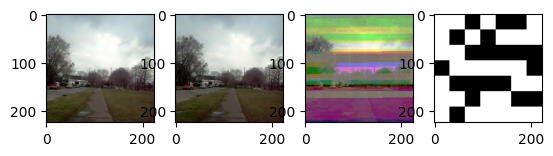

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3600 Training loss: 0.001489107425396259 Validation loss: 0.0


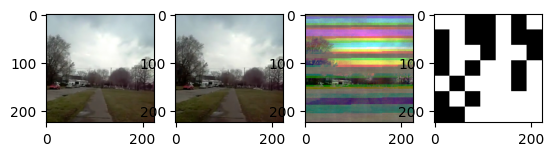

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3700 Training loss: 0.0018202530158745063 Validation loss: 0.0


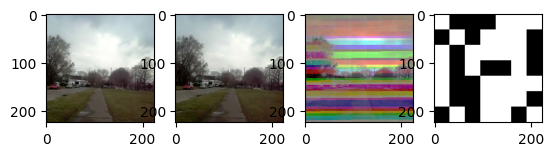

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3800 Training loss: 0.00146941160544371 Validation loss: 0.0


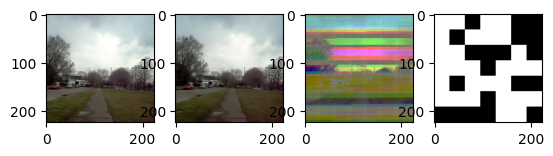

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 3900 Training loss: 0.0016387130751277937 Validation loss: 0.0


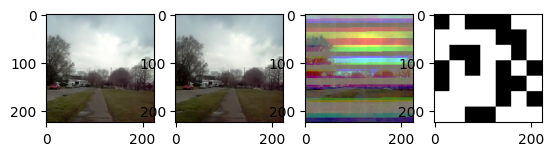

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4000 Training loss: 0.0016365601466252254 Validation loss: 0.0


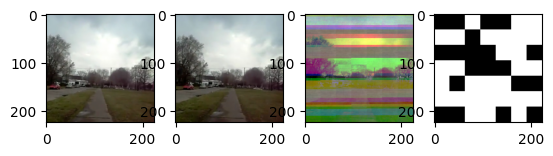

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4100 Training loss: 0.0013898266104114799 Validation loss: 0.0


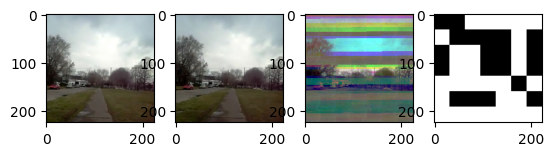

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4200 Training loss: 0.0015731311979747954 Validation loss: 0.0


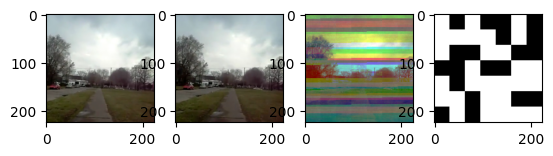

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4300 Training loss: 0.0013995934755374223 Validation loss: 0.0


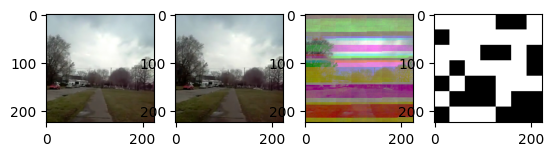

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4400 Training loss: 0.001287019209110693 Validation loss: 0.0


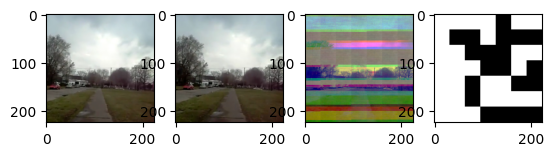

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4500 Training loss: 0.001674155001238589 Validation loss: 0.0


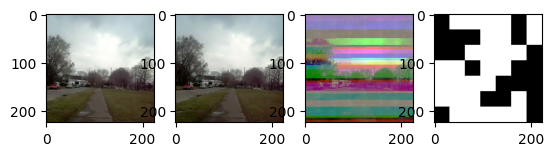

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4600 Training loss: 0.0015746553302247882 Validation loss: 0.0


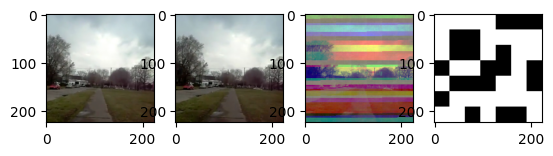

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4700 Training loss: 0.001631065166040218 Validation loss: 0.0


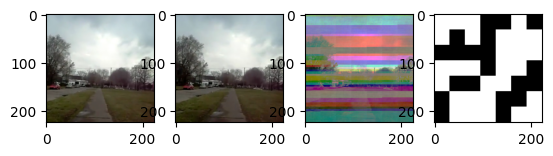

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4800 Training loss: 0.001578453608921596 Validation loss: 0.0


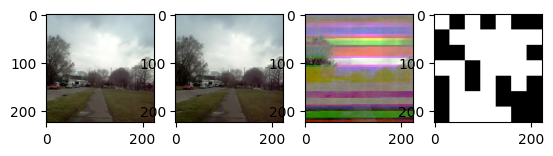

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 4900 Training loss: 0.0016144495743971605 Validation loss: 0.0


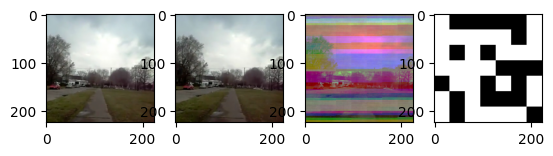

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5000 Training loss: 0.0013543621524349674 Validation loss: 0.0


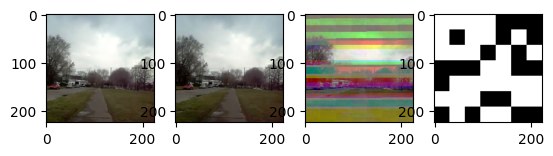

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5100 Training loss: 0.0014449933509686928 Validation loss: 0.0


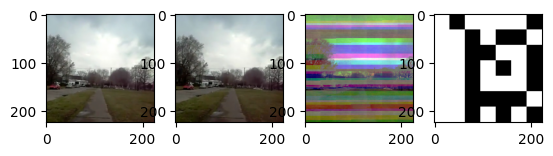

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5200 Training loss: 0.0015674040867732122 Validation loss: 0.0


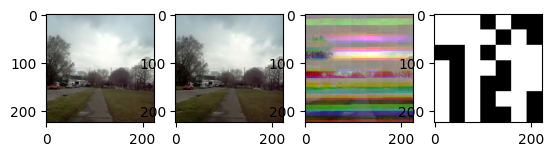

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5300 Training loss: 0.0012681428329411881 Validation loss: 0.0


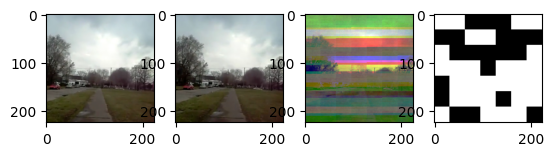

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5400 Training loss: 0.001360352397401691 Validation loss: 0.0


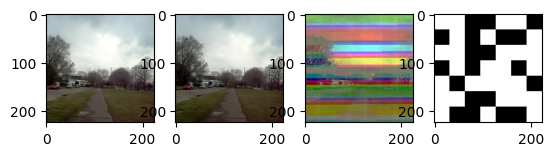

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5500 Training loss: 0.0015605460156451214 Validation loss: 0.0


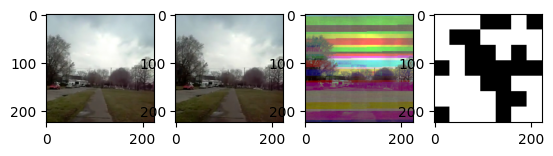

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5600 Training loss: 0.0016866710159804796 Validation loss: 0.0


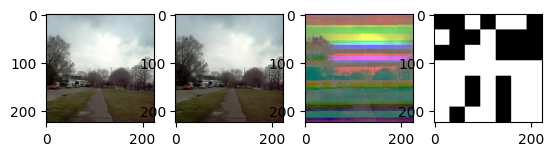

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5700 Training loss: 0.0015302053737989711 Validation loss: 0.0


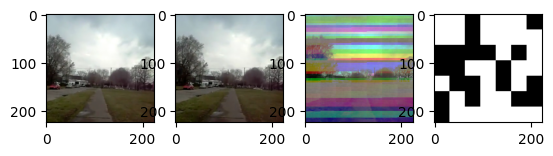

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5800 Training loss: 0.0014183698556362054 Validation loss: 0.0


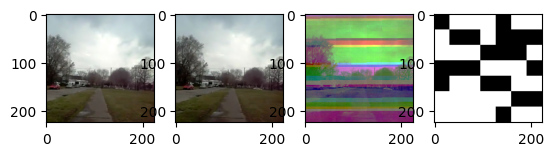

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5900 Training loss: 0.0016715994684687464 Validation loss: 0.0


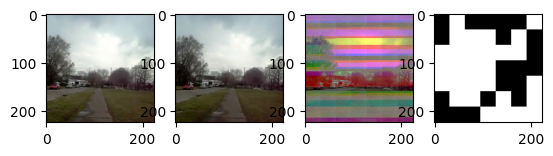

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6000 Training loss: 0.0016282076364035134 Validation loss: 0.0


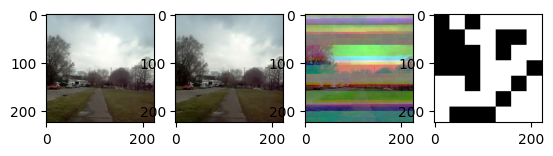

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6100 Training loss: 0.0014051919455056662 Validation loss: 0.0


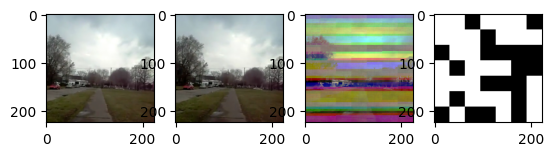

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6200 Training loss: 0.0013267686515500694 Validation loss: 0.0


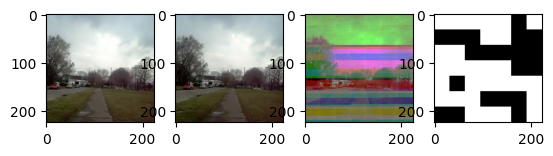

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6300 Training loss: 0.001663328876425495 Validation loss: 0.0


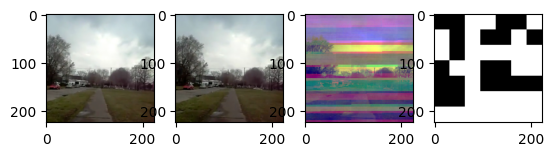

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6400 Training loss: 0.0012843145118964898 Validation loss: 0.0


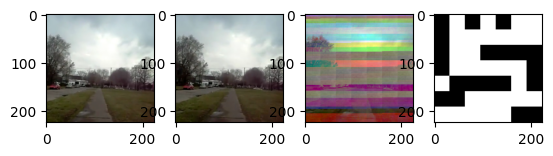

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6500 Training loss: 0.0017070820916703332 Validation loss: 0.0


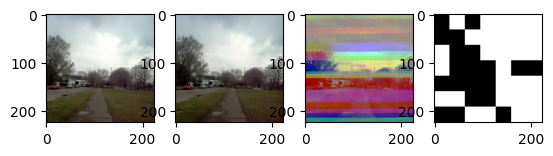

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6600 Training loss: 0.0016176725045228615 Validation loss: 0.0


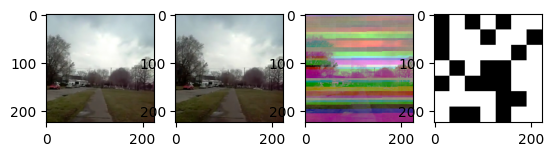

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6700 Training loss: 0.0013108697129693223 Validation loss: 0.0


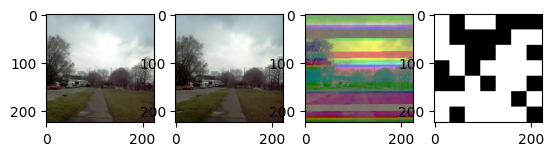

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6800 Training loss: 0.001460493877257183 Validation loss: 0.0


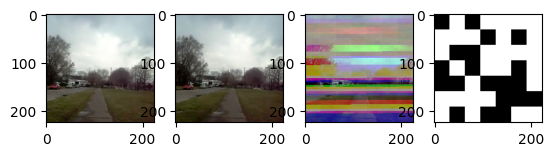

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 6900 Training loss: 0.001501933820955046 Validation loss: 0.0


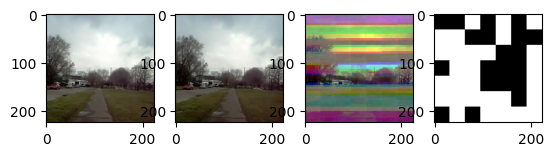

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7000 Training loss: 0.0015451109889662747 Validation loss: 0.0


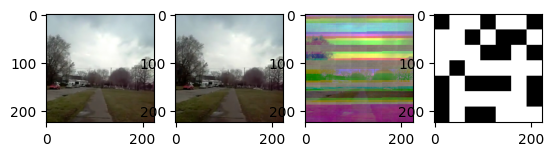

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7100 Training loss: 0.0014012604842692504 Validation loss: 0.0


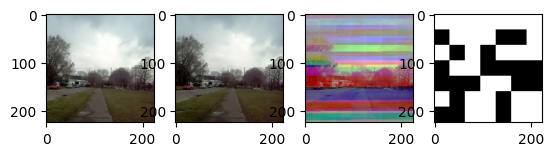

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7200 Training loss: 0.0014690081278483072 Validation loss: 0.0


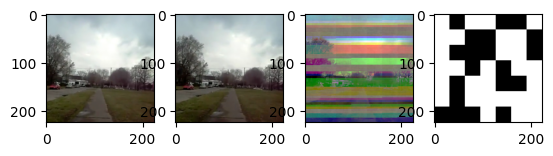

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7300 Training loss: 0.0014750140053885325 Validation loss: 0.0


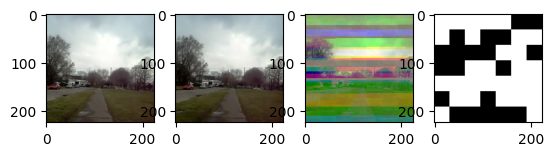

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7400 Training loss: 0.001571346464611235 Validation loss: 0.0


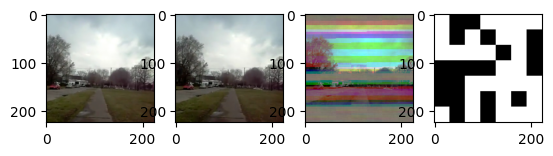

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7500 Training loss: 0.001561743173843775 Validation loss: 0.0


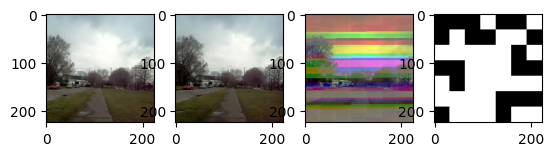

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7600 Training loss: 0.0013003111758948245 Validation loss: 0.0


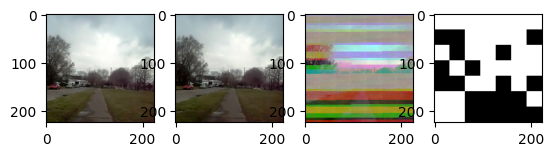

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7700 Training loss: 0.001497369633489476 Validation loss: 0.0


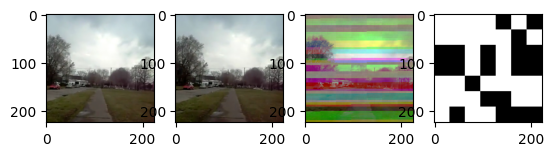

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7800 Training loss: 0.0015956861195546804 Validation loss: 0.0


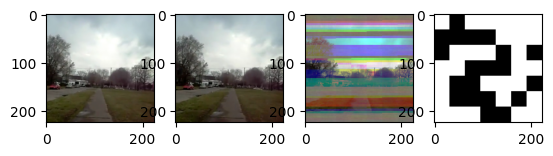

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 7900 Training loss: 0.0015978289174509571 Validation loss: 0.0


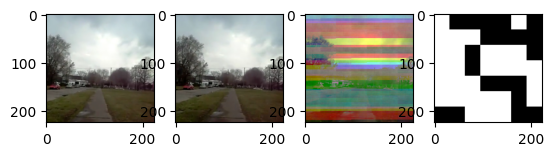

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8000 Training loss: 0.0014061983688410384 Validation loss: 0.0


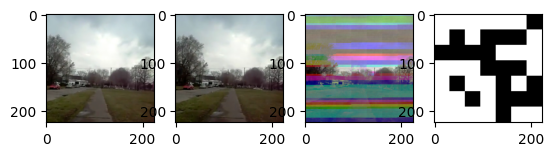

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8100 Training loss: 0.0016948280753670158 Validation loss: 0.0


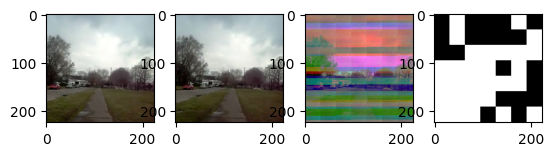

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8200 Training loss: 0.0016393661499023438 Validation loss: 0.0


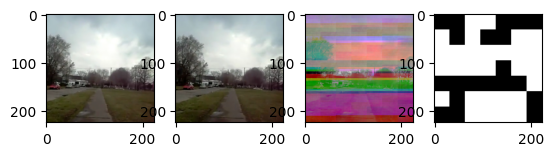

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8300 Training loss: 0.0015150094643617289 Validation loss: 0.0


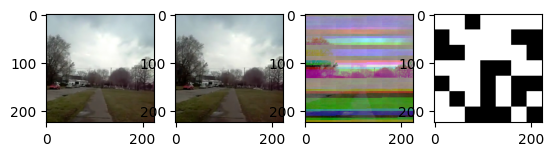

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8400 Training loss: 0.0014208826826605605 Validation loss: 0.0


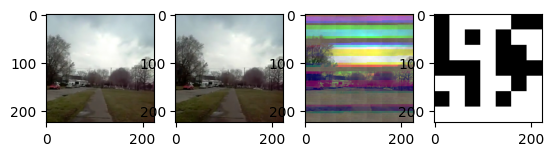

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8500 Training loss: 0.0015146229293320206 Validation loss: 0.0


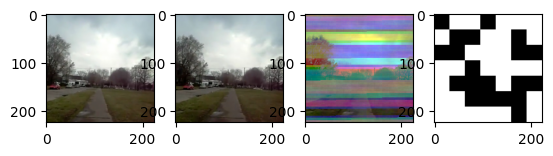

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8600 Training loss: 0.0015533094441061055 Validation loss: 0.0


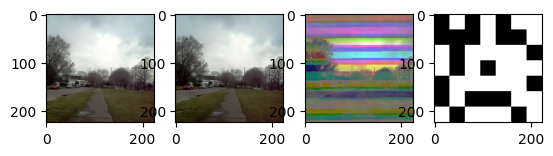

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8700 Training loss: 0.0016065157376802884 Validation loss: 0.0


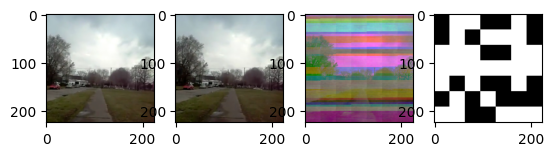

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8800 Training loss: 0.001361697148054074 Validation loss: 0.0


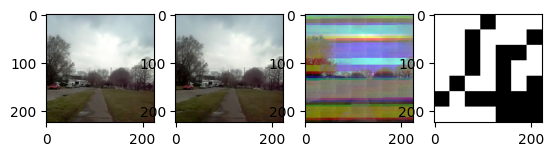

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 8900 Training loss: 0.0015515491639301454 Validation loss: 0.0


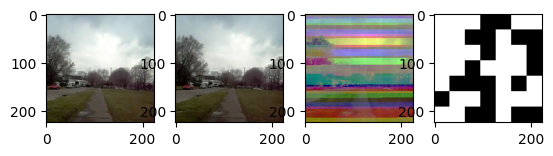

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9000 Training loss: 0.0013396117276761122 Validation loss: 0.0


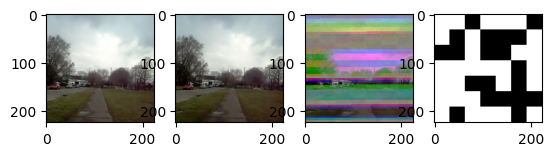

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9100 Training loss: 0.00132229066157079 Validation loss: 0.0


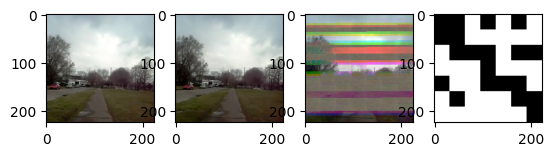

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9200 Training loss: 0.0016029665321657509 Validation loss: 0.0


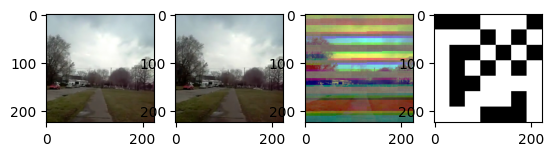

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9300 Training loss: 0.0015150183723086402 Validation loss: 0.0


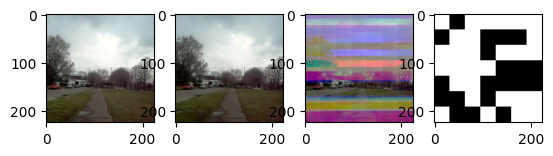

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9400 Training loss: 0.001443260580628783 Validation loss: 0.0


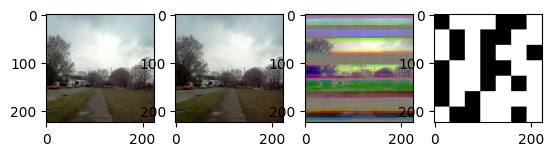

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9500 Training loss: 0.0014372527817666748 Validation loss: 0.0


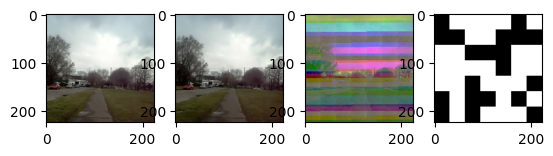

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9600 Training loss: 0.0015631403241838729 Validation loss: 0.0


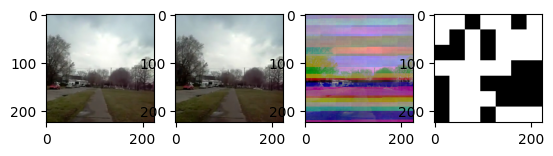

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9700 Training loss: 0.0013330146069928403 Validation loss: 0.0


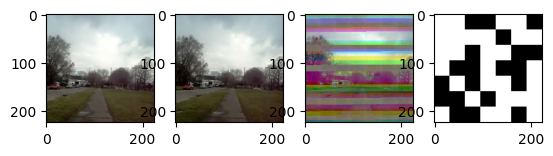

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9800 Training loss: 0.0014782596420455764 Validation loss: 0.0


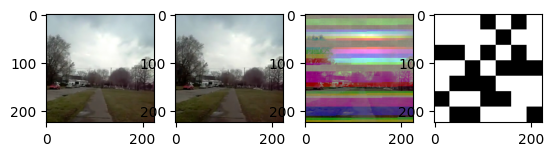

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 9900 Training loss: 0.0015605916033734333 Validation loss: 0.0


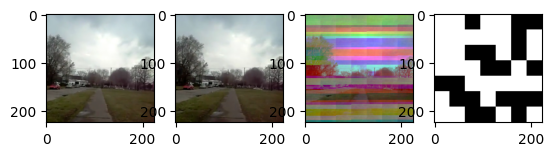

In [43]:
#with torch.autograd.detect_anomaly():
train_loss, val_loss = train(model, dloader, dloader, nn.MSELoss(reduction='none'), optimizer, 10000)

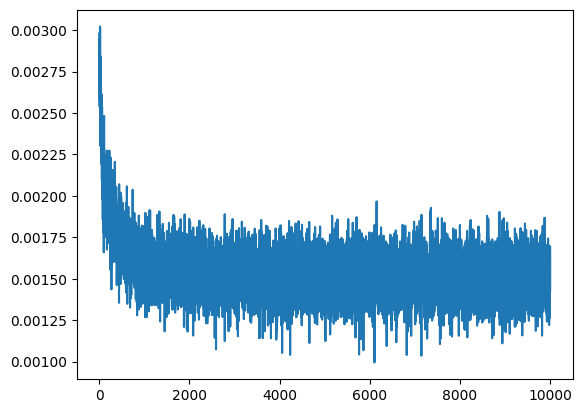

In [44]:
plt.plot(train_loss, label="Training loss")

Overfitting to one sample works! (Note that the loss is way too small, due to the division by the whole dataset size)

In [38]:
# 8 examples

BATCH_SIZE = 6
NUM_WORKERS = 0 # Has to be 0 for jupyter notebooks
CHANNELS = 3
IMAGE_SIZE = 224
REPEATED_SAMPLING_FACTOR = 2

# ViT hyperparameters
patch_size = 32
D = 128
encoder_heads = 8
encoder_layers = 2
encoder_mlp_dim = 128
decoder_heads = 8
decoder_layers = 2
decoder_mlp_dim = 128
mlp_activation = nn.GELU()

# masking
mask_ratio = 0.2
mask_type = 'random'

# other hyperparameters
frame_gap_range = (4, 5)
fps = 29


# Calculated parameters
clip_duration = frame_gap_range[1] / fps + 0.0001

device = torch.device("cpu")
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    
print("Using device =", device)

Using device = mps


In [39]:
print(data.num_videos)

dloader = torch.utils.data.DataLoader(
        data,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS
    )

1365


In [40]:
# Create ViT
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

embedding = Embedding(D, patch_size, CHANNELS, IMAGE_SIZE//patch_size * IMAGE_SIZE//patch_size)
encoder = ViT_Encoder(D, encoder_heads, (encoder_mlp_dim, mlp_activation), encoder_layers)
decoder = CrossSelfDecoder(D, decoder_heads, (decoder_mlp_dim, mlp_activation), decoder_layers)
masking = Masking(D)

embedding.train(), encoder.train(), decoder.train(), masking.train()

embedding.to(device)
encoder.to(device)
decoder.to(device)
masking.to(device)

embedding_params = count_parameters(embedding)
encoder_params = count_parameters(encoder)
decoder_params = count_parameters(decoder)
masking_params = count_parameters(masking)

model = (embedding, encoder, decoder, masking)

print("Embedding parameters:", embedding_params)
print("Encoder parameters:", encoder_params)
print("Decoder parameters:", decoder_params)
print("Masking parameters:", masking_params)
print("Total parameters:", embedding_params + encoder_params + decoder_params + masking_params)

Embedding parameters: 789632
Encoder parameters: 199168
Decoder parameters: 331776
Masking parameters: 128
Total parameters: 1320704


In [41]:
def validate(model, dataloader, loss_fn):
    return 0.0

DEBUG = True
def train(model, dataloader, vdataloader, loss_fn, optimizer, epochs):
    batch_orig = None
    for b in dataloader:
        batch_orig = b
        break
    train_loss = []
    val_loss = []
    embedding, encoder, decoder, masking = model
    for epoch in range(epochs):
        epoch_loss = 0
        #for batch_nr, batch in enumerate(dataloader):
        #for batch_nr, batch in enumerate(tqdm(dataloader, total=data.num_videos//BATCH_SIZE)):
        batch = batch_orig

        # batch.shape = (batch_size, repeated_sampled_frames, channels, height, width)
        # change to (batch_size * repeated_sampled_frames, channels, height, width)
        batch_size = batch['video'].shape[0] # actual batch size (important for last batch)
        batch = batch['video'].to(device)
        images = batch.view(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)
        if DEBUG: print("images.shape: ", images.shape) # [18, 3, 224, 224]
        optimizer.zero_grad()
        # embedding
        embeddings = embedding.embedding(images).view(batch_size, REPEATED_SAMPLING_FACTOR+1, -1, D)
        #print(embeddings[0, 0, 0, :5])
        if DEBUG: print("Embeddings.shape: ", embeddings.shape) # [6, 3, 49, 128]

        # masking
        first_frame = embeddings[:, 0, :, :]
        if DEBUG: print("First_frame.shape: ", first_frame.shape) # [6, 49, 128]
        future_frames, shuff_idx, skipped_token = masking.mask(embeddings[:, 1:, :, :].reshape(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), mask_ratio, mask_type)
        if DEBUG: print("Future_frames.shape: ", future_frames.shape) # [12, 40, 128]

        # encoder
        first_frame = encoder(first_frame)
        if DEBUG: print("First_frame.shape (after encoding): ", first_frame.shape) # [6, 49, 128]
        future_frames = encoder(future_frames)
        #print(future_frames[0, 0, :5])
        if DEBUG: print("Future_frames.shape (after encoding): ", future_frames.shape) # [12, 40, 128]

        # unmasking
        future_frames = masking.unmask(future_frames, mask_type, shuff_idx, skipped_token)
        if DEBUG: print("Future_frames.shape (after unmasking): ", future_frames.shape) # [12, 49, 128]

        # decoder (future_frames is the query, first_frame provide key and value)
        # future_frames.shape = (batch_size * repeated_sampled_frames, N, D)
        # first_frame.shape = (batch_size, N, D)
        
        # TODO: check if this is correct
        output = decoder(future_frames, first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D))
        #output = decoder(first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), future_frames)
        if DEBUG: print("Output.shape: ", output.shape) # [12, 49, 128]
        #print(output[0, 0, :5])

        # unembedding
        output = embedding.unembedding(output)
        if DEBUG: print("Output.shape (after unembedding): ", output.shape) # [12, 3, 224, 224]

        # calculate loss
        #loss = loss_fn(output.reshape(-1, 1), batch[:, 1:, :, :, :].reshape(-1, 1))
        mask = masking.create_mask(IMAGE_SIZE//patch_size, mask_type, shuff_idx, skipped_token, H=IMAGE_SIZE, W=IMAGE_SIZE, device=device)
        
        # Loss is calculated only on the masked tokens (MAE)
        loss = (loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)) * mask).sum() / mask.sum()

        # Loss is calculated on all tokens (SiamMAE)
        #loss = loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)).mean()

        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()

        train_loss.append(epoch_loss/(data.num_videos//BATCH_SIZE))
        val_loss.append(validate(model, vdataloader, loss_fn))
        if epoch % 100 == 0:
            print("Epoch", epoch, "Training loss:", train_loss[-1], "Validation loss:", val_loss[-1])
            # plot image
            fig, ax = plt.subplots(3, 4)
            for i in range(3):
                ax[i, 0].imshow(unnormalize(batch[i, 0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 1].imshow(unnormalize(batch[i, 1, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 2].imshow(unnormalize(output[i*REPEATED_SAMPLING_FACTOR, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
                ax[i, 3].imshow(mask[0, :, :].permute(1, 2, 0).detach().cpu().numpy())
            plt.show()
    return train_loss, val_loss


In [42]:
optimizer = torch.optim.AdamW(list(embedding.parameters()) + list(encoder.parameters()) + list(decoder.parameters()) + list(masking.parameters()), lr=3e-4, betas=(0.9, 0.95), weight_decay=0.05)

images.shape:  torch.Size([18, 3, 224, 224])
Embeddings.shape:  torch.Size([6, 3, 49, 128])
First_frame.shape:  torch.Size([6, 49, 128])
Future_frames.shape:  torch.Size([12, 40, 128])
First_frame.shape (after encoding):  torch.Size([6, 49, 128])
Future_frames.shape (after encoding):  torch.Size([12, 40, 128])
Future_frames.shape (after unmasking):  torch.Size([12, 49, 128])
Output.shape:  torch.Size([12, 49, 128])
Output.shape (after unembedding):  torch.Size([12, 3, 224, 224])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 Training loss: 0.0840603916655553 Validation loss: 0.0


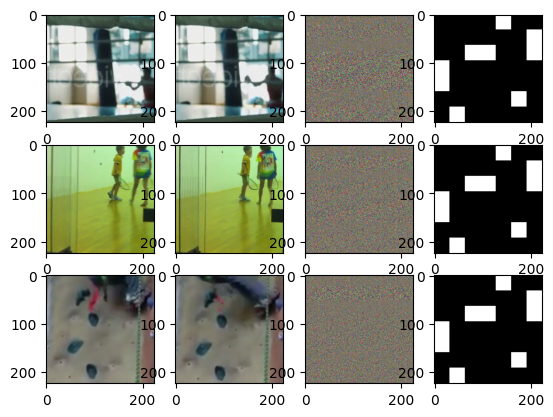

images.shape:  torch.Size([18, 3, 224, 224])
Embeddings.shape:  torch.Size([6, 3, 49, 128])
First_frame.shape:  torch.Size([6, 49, 128])
Future_frames.shape:  torch.Size([12, 40, 128])
First_frame.shape (after encoding):  torch.Size([6, 49, 128])
Future_frames.shape (after encoding):  torch.Size([12, 40, 128])
Future_frames.shape (after unmasking):  torch.Size([12, 49, 128])
Output.shape:  torch.Size([12, 49, 128])
Output.shape (after unembedding):  torch.Size([12, 3, 224, 224])
images.shape:  torch.Size([18, 3, 224, 224])
Embeddings.shape:  torch.Size([6, 3, 49, 128])
First_frame.shape:  torch.Size([6, 49, 128])
Future_frames.shape:  torch.Size([12, 40, 128])
First_frame.shape (after encoding):  torch.Size([6, 49, 128])
Future_frames.shape (after encoding):  torch.Size([12, 40, 128])
Future_frames.shape (after unmasking):  torch.Size([12, 49, 128])
Output.shape:  torch.Size([12, 49, 128])
Output.shape (after unembedding):  torch.Size([12, 3, 224, 224])
images.shape:  torch.Size([18, 3

KeyboardInterrupt: 

In [43]:
train_loss, val_loss = train(model, dloader, dloader, nn.MSELoss(reduction='none'), optimizer, 1000)

In [13]:
BATCH_SIZE = 8
NUM_WORKERS = 0 # Has to be 0 for jupyter notebooks
CHANNELS = 3
IMAGE_SIZE = 48
REPEATED_SAMPLING_FACTOR = 4

# ViT hyperparameters
patch_size = 6
D = 128
encoder_heads = 8
encoder_layers = 2
encoder_mlp_dim = 128
decoder_heads = 8
decoder_layers = 2
decoder_mlp_dim = 128
mlp_activation = nn.ReLU()

# masking
mask_ratio = 0.9
mask_type = 'random'

# other hyperparameters
frame_gap_range = (4, 25)
fps = 29


# Calculated parameters
clip_duration = frame_gap_range[1] / fps + 0.0001

device = torch.device("cpu")
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
    
print("Using device =", device)

Using device = mps


In [14]:
transform = Compose(
    [
    ApplyTransformToKey(
        key="video",
        transform=Compose(
            [
            RandomTemporalSubsample(frame_gap_range[0], frame_gap_range[1], repeated_sampling=REPEATED_SAMPLING_FACTOR),
            RandomResizedCrop(IMAGE_SIZE, IMAGE_SIZE, scale=(0.2, 1.0), aspect_ratio=(1.0, 1.0), interpolation='bilinear'),
            Div255(),
            # mean and std from ImageNet
            Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
            # Permute to get Frames, Channel, Height, Width
            Permute((1, 0, 2, 3)),
            RandomHorizontalFlip(p=0.5)
            ]
        ),
        ),
    ]
)

def unnormalize(tensor):
    return tensor * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
data = Kinetics("../data/", clip_sampler=RandomClipSampler(clip_duration=clip_duration), decode_audio=False, transform=transform)

dloader = torch.utils.data.DataLoader(
        data,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        shuffle=False
    )

In [15]:
# Create ViT
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

embedding = Embedding(D, patch_size, CHANNELS, IMAGE_SIZE//patch_size * IMAGE_SIZE//patch_size)
encoder = ViT_Encoder(D, encoder_heads, (encoder_mlp_dim, mlp_activation), encoder_layers)
decoder = CrossSelfDecoder(D, decoder_heads, (decoder_mlp_dim, mlp_activation), decoder_layers)
masking = Masking(D)

embedding.train(), encoder.train(), decoder.train(), masking.train()

embedding.to(device)
encoder.to(device)
decoder.to(device)
masking.to(device)

embedding_params = count_parameters(embedding)
encoder_params = count_parameters(encoder)
decoder_params = count_parameters(decoder)
masking_params = count_parameters(masking)

model = (embedding, encoder, decoder, masking)

print("Embedding parameters:", embedding_params)
print("Encoder parameters:", encoder_params)
print("Decoder parameters:", decoder_params)
print("Masking parameters:", masking_params)
print("Total parameters:", embedding_params + encoder_params + decoder_params + masking_params)

Embedding parameters: 27884
Encoder parameters: 199168
Decoder parameters: 331776
Masking parameters: 128
Total parameters: 558956


In [20]:
def validate(model, dataloader, loss_fn):
    return 0.0

DEBUG = False
def train(model, dataloader, vdataloader, loss_fn, optimizer, epochs):
    batch_orig = None
    for b in dataloader:
        batch_orig = b
        break
    train_loss = []
    val_loss = []
    embedding, encoder, decoder, masking = model
    for epoch in range(epochs):
        epoch_loss = 0
        #for batch_nr, batch in enumerate(dataloader):
        for batch_nr, batch in enumerate(tqdm(dataloader, total=data.num_videos//BATCH_SIZE)):

            # batch.shape = (batch_size, repeated_sampled_frames, channels, height, width)
            # change to (batch_size * repeated_sampled_frames, channels, height, width)
            batch_size = batch['video'].shape[0] # actual batch size (important for last batch)
            batch = batch['video'].to(device)
            images = batch.view(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)
            if DEBUG: print("images.shape: ", images.shape)
            optimizer.zero_grad()
            # embedding
            embeddings = embedding.embedding(images).view(batch_size, REPEATED_SAMPLING_FACTOR+1, -1, D)
            #print(embeddings[0, 0, 0, :5])
            if DEBUG: print("Embeddings.shape: ", embeddings.shape)

            # masking
            first_frame = embeddings[:, 0, :, :]
            if DEBUG: print("First_frame.shape: ", first_frame.shape)
            future_frames, shuff_idx, skipped_token = masking.mask(embeddings[:, 1:, :, :].reshape(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), mask_ratio, mask_type)
            n_embeddings = future_frames.shape[-2]
            if DEBUG: print("Future_frames.shape: ", future_frames.shape)

            # encoder
            first_frame = encoder(first_frame)
            if DEBUG: print("First_frame.shape (after encoding): ", first_frame.shape)
            future_frames = encoder(future_frames)
            #print(future_frames[0, 0, :5])
            if DEBUG: print("Future_frames.shape (after encoding): ", future_frames.shape)

            # unmasking
            future_frames = masking.unmask(future_frames, mask_type, shuff_idx, skipped_token)
            if DEBUG: print("Future_frames.shape (after unmasking): ", future_frames.shape)

            # decoder (future_frames is the query, first_frame provide key and value)
            # future_frames.shape = (batch_size * repeated_sampled_frames, N, D)
            # first_frame.shape = (batch_size, N, D)
            
            output = decoder(future_frames, first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D))
            #output = decoder(first_frame.repeat(1, REPEATED_SAMPLING_FACTOR, 1).view(batch_size*REPEATED_SAMPLING_FACTOR, -1, D), future_frames)
            if DEBUG: print("Output.shape: ", output.shape)
            #print(output[0, 0, :5])

            # unembedding
            output = embedding.unembedding(output)
            if DEBUG: print("Output.shape (after unembedding): ", output.shape)

            # calculate loss
            #loss = loss_fn(output.reshape(-1, 1), batch[:, 1:, :, :, :].reshape(-1, 1))
            mask = masking.create_mask(IMAGE_SIZE//patch_size, mask_type, shuff_idx, skipped_token, H=IMAGE_SIZE, W=IMAGE_SIZE, device=device)
            
            # Loss is calculated only on the masked tokens (MAE)
            #loss = (loss_fn(output, batch[:, 1:]) * mask).sum() / mask.sum()

            # Loss is calculated on all tokens (SiamMAE)
            loss = loss_fn(output, batch[:, 1:].reshape(-1, CHANNELS, IMAGE_SIZE, IMAGE_SIZE)).mean()

            epoch_loss += loss.item()
            loss.backward()
            optimizer.step()
            if batch_nr > 3: break

        train_loss.append(epoch_loss/(data.num_videos//BATCH_SIZE))
        val_loss.append(validate(model, vdataloader, loss_fn))
        if epoch % 5 == 0:
            print("Epoch", epoch, "Training loss:", train_loss[-1], "Validation loss:", val_loss[-1])
            # plot image
            fig, ax = plt.subplots(1, 4)
            
            ax[0].imshow(unnormalize(batch[0, 0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[1].imshow(unnormalize(batch[0, 1, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[2].imshow(unnormalize(output[0, :, :, :].detach().cpu()).permute(1, 2, 0).numpy())
            ax[3].imshow(mask[0, :, :].permute(1, 2, 0).detach().cpu().numpy())
            plt.show()
    return train_loss, val_loss


In [21]:
optimizer = torch.optim.Adam(list(embedding.parameters()) + list(encoder.parameters()) + list(decoder.parameters()) + list(masking.parameters()), lr=3e-4)

  2%|▏         | 4/170 [00:10<07:28,  2.70s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 0 Training loss: 0.07625787678886863 Validation loss: 0.0


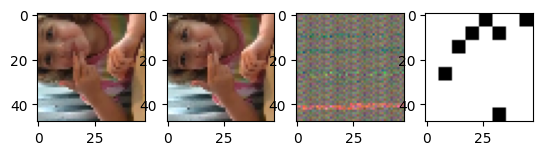

  2%|▏         | 4/170 [00:11<07:44,  2.80s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 5 Training loss: 0.043972915060379925 Validation loss: 0.0


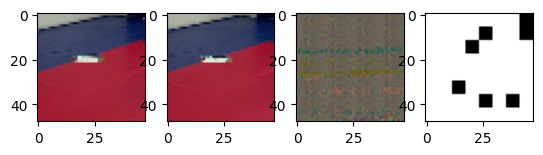

  2%|▏         | 4/170 [00:08<05:36,  2.03s/it]

Epoch 10 Training loss: 0.029475737319273106 Validation loss: 0.0


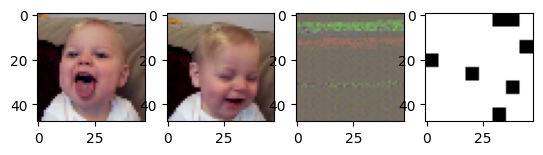

  2%|▏         | 4/170 [00:06<04:43,  1.70s/it]

Epoch 15 Training loss: 0.03127344005248126 Validation loss: 0.0


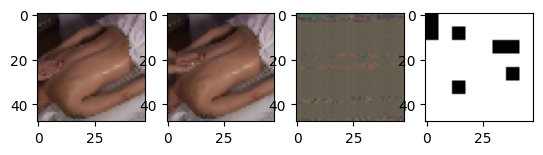

  2%|▏         | 4/170 [00:07<04:55,  1.78s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 Training loss: 0.03241835902718937 Validation loss: 0.0


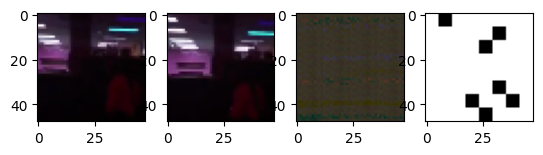

  2%|▏         | 4/170 [00:09<06:22,  2.30s/it]

Epoch 25 Training loss: 0.036532493899850284 Validation loss: 0.0


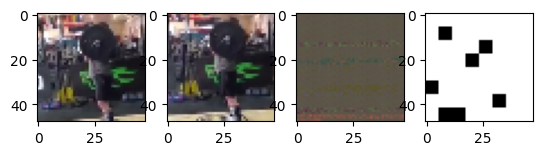

  2%|▏         | 4/170 [00:08<06:07,  2.21s/it]

Epoch 30 Training loss: 0.03038635288967806 Validation loss: 0.0


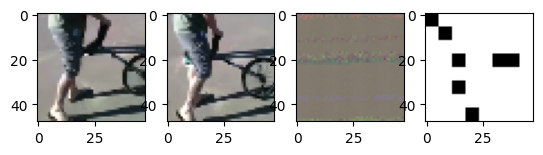

  2%|▏         | 4/170 [00:11<08:07,  2.94s/it]

Epoch 35 Training loss: 0.027714014403960284 Validation loss: 0.0


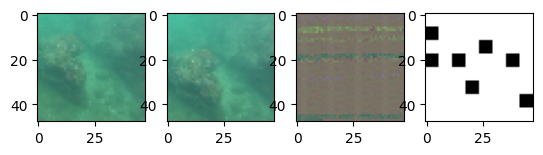

  2%|▏         | 4/170 [00:08<05:33,  2.01s/it]

Epoch 40 Training loss: 0.033913271918016324 Validation loss: 0.0


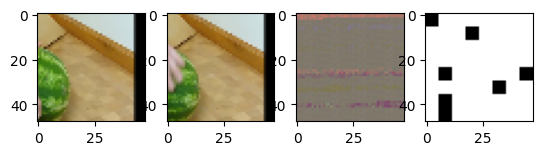

  2%|▏         | 4/170 [00:09<06:16,  2.27s/it]

Epoch 45 Training loss: 0.033097222973318664 Validation loss: 0.0


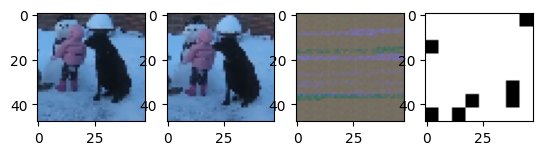

  2%|▏         | 4/170 [00:10<07:27,  2.69s/it]

Epoch 50 Training loss: 0.03194974450504079 Validation loss: 0.0


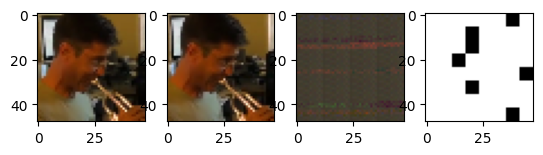

  2%|▏         | 4/170 [00:08<05:49,  2.11s/it]

Epoch 55 Training loss: 0.0335305673234603 Validation loss: 0.0


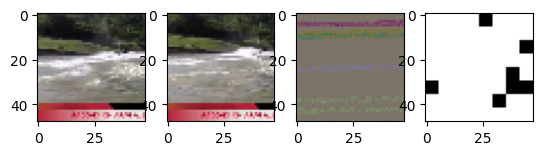

  2%|▏         | 4/170 [00:12<08:20,  3.02s/it]

Epoch 60 Training loss: 0.03373874706380507 Validation loss: 0.0


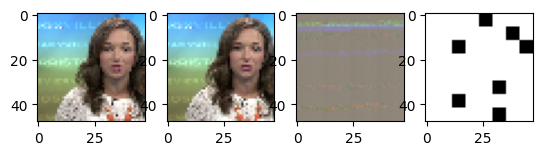

  2%|▏         | 4/170 [00:10<07:17,  2.64s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 65 Training loss: 0.034072042913997874 Validation loss: 0.0


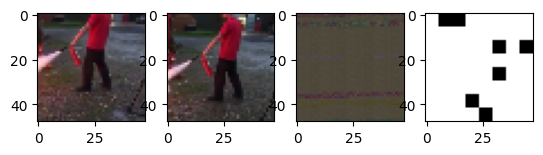

  2%|▏         | 4/170 [00:09<06:25,  2.32s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 70 Training loss: 0.03086411812726189 Validation loss: 0.0


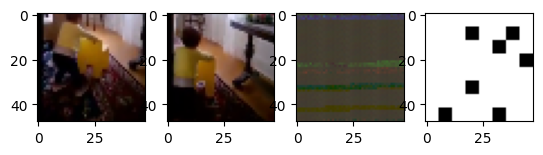

  2%|▏         | 4/170 [00:08<05:42,  2.06s/it]

Epoch 75 Training loss: 0.035227800116819495 Validation loss: 0.0


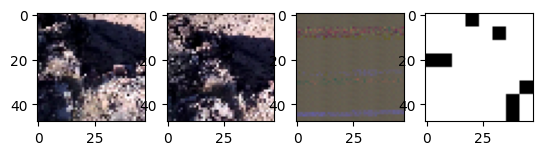

  2%|▏         | 4/170 [00:09<06:43,  2.43s/it]

Epoch 80 Training loss: 0.028958884056876688 Validation loss: 0.0


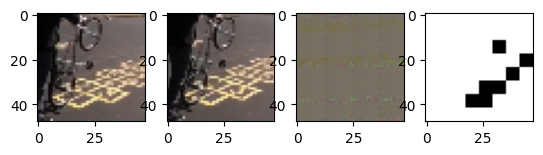

  2%|▏         | 4/170 [00:08<05:36,  2.03s/it]

Epoch 85 Training loss: 0.03476997964522418 Validation loss: 0.0


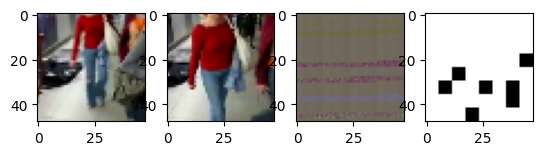

  2%|▏         | 4/170 [00:08<05:40,  2.05s/it]

Epoch 90 Training loss: 0.03769500430892495 Validation loss: 0.0


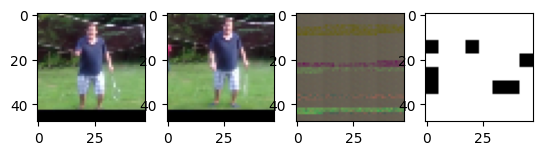

  2%|▏         | 4/170 [00:13<09:38,  3.49s/it]


Epoch 95 Training loss: 0.02802589114974527 Validation loss: 0.0


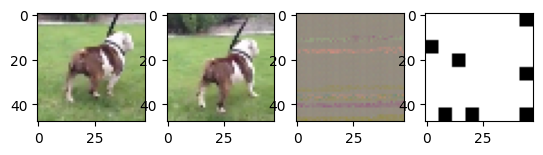

  2%|▏         | 4/170 [00:15<10:58,  3.97s/it]


In [22]:
train_loss, val_loss = train(model, dloader, dloader, nn.MSELoss(reduction='none'), optimizer, 100)